Task1

In [ ]:
import cv2 as cv
import numpy as np
from google.colab.patches import cv2_imshow

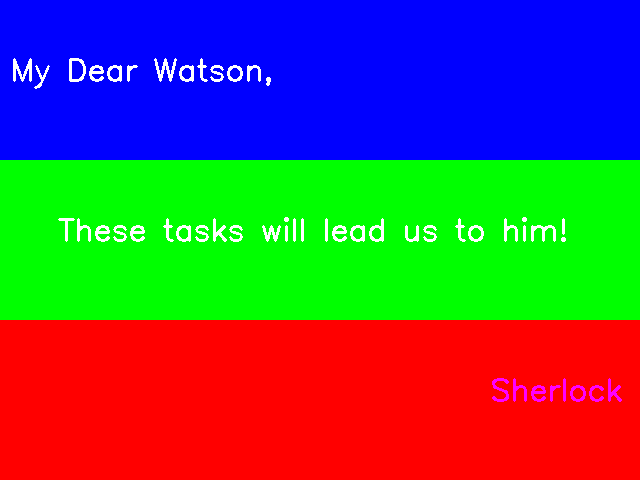

In [ ]:
img = cv.imread('/content/for_watson.png')
img.shape
for i in range(img.shape[2]):
    for j in range(img.shape[1]):
        for k in range(img.shape[0]):
            if 0<img[k,j,i]<255:
                img[k,j,i]=255
cv2_imshow(img)

Task2

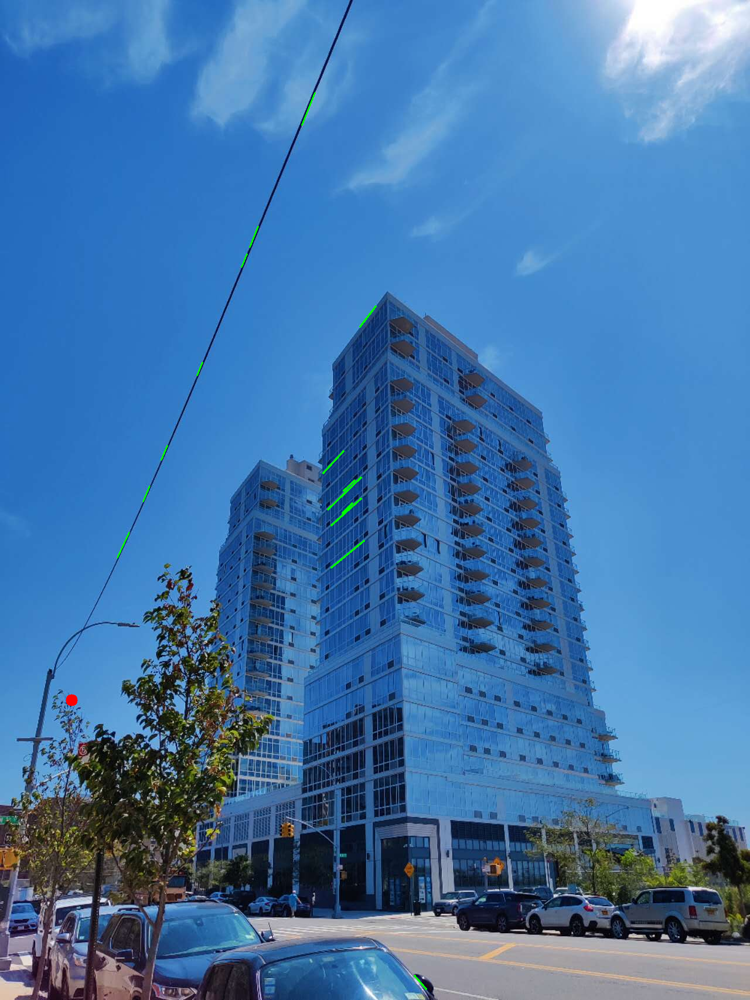

In [ ]:
import os
import cv2
import math
import numpy as np


# Threshold by which lines will be rejected wrt the horizontal
REJECT_DEGREE_TH = 4.0


def ReadImage(InputImagePath):
    Images = []                     # Input Images will be stored in this list.
    ImageNames = []                 # Names of input images will be stored in this list.
    
    # Checking if path is of file or folder.
    if os.path.isfile(InputImagePath):						    # If path is of file.
        InputImage = cv2.imread(InputImagePath)                 # Reading the image.
        
        # Checking if image is read.
        if InputImage is None:
            print("Image not read. Provide a correct path")
            exit()
        
        Images.append(InputImage)                               # Storing the image.
        ImageNames.append(os.path.basename(InputImagePath))     # Storing the image's name.

	# If path is of a folder contaning images.
    elif os.path.isdir(InputImagePath):
		# Getting all image's name present inside the folder.
        for ImageName in os.listdir(InputImagePath):
			# Reading images one by one.
            InputImage = cv2.imread(InputImagePath + "/" + ImageName)
			
            Images.append(InputImage)							# Storing images.
            ImageNames.append(ImageName)                        # Storing image's names.
        
    # If it is neither file nor folder(Invalid Path).
    else:
        print("\nEnter valid Image Path.\n")
        exit()

    return Images, ImageNames
        

def FilterLines(Lines):
    FinalLines = []
    
    for Line in Lines:
        [[x1, y1, x2, y2]] = Line

        # Calculating equation of the line: y = mx + c
        if x1 != x2:
            m = (y2 - y1) / (x2 - x1)
        else:
            m = 100000000
        c = y2 - m*x2
        # theta will contain values between -90 -> +90. 
        theta = math.degrees(math.atan(m))

        # Rejecting lines of slope near to 0 degree or 90 degree and storing others
        if REJECT_DEGREE_TH <= abs(theta) <= (90 - REJECT_DEGREE_TH):
            l = math.sqrt( (y2 - y1)**2 + (x2 - x1)**2 )    # length of the line
            FinalLines.append([x1, y1, x2, y2, m, c, l])

    
    # Removing extra lines 
    # (we might get many lines, so we are going to take only longest 15 lines 
    # for further computation because more than this number of lines will only 
    # contribute towards slowing down of our algo.)
    if len(FinalLines) > 15:
        FinalLines = sorted(FinalLines, key=lambda x: x[-1], reverse=True)
        FinalLines = FinalLines[:15]
    
    return FinalLines
    


def GetLines(Image):
    # Converting to grayscale
    GrayImage = cv2.cvtColor(Image, cv2.COLOR_BGR2GRAY)
    # Blurring image to reduce noise.
    BlurGrayImage = cv2.GaussianBlur(GrayImage, (5, 5), 1)
    # Generating Edge image
    EdgeImage = cv2.Canny(BlurGrayImage, 40, 255)

    # Finding Lines in the image
    Lines = cv2.HoughLinesP(EdgeImage, 1, np.pi / 180, 50, 10, 15)

    # Check if lines found and exit if not.
    if Lines is None:
        print("Not enough lines found in the image for Vanishing Point detection.")
        exit(0)
    
    # Filtering Lines wrt angle
    FilteredLines = FilterLines(Lines)

    return FilteredLines
    

def GetVanishingPoint(Lines):
    # We will apply RANSAC inspired algorithm for this. We will take combination 
    # of 2 lines one by one, find their intersection point, and calculate the 
    # total error(loss) of that point. Error of the point means root of sum of 
    # squares of distance of that point from each line.
    VanishingPoint = None
    MinError = 100000000000

    for i in range(len(Lines)):
        for j in range(i+1, len(Lines)):
            m1, c1 = Lines[i][4], Lines[i][5]
            m2, c2 = Lines[j][4], Lines[j][5]

            if m1 != m2:
                x0 = (c1 - c2) / (m2 - m1)
                y0 = m1 * x0 + c1

                err = 0
                for k in range(len(Lines)):
                    m, c = Lines[k][4], Lines[k][5]
                    m_ = (-1 / m)
                    c_ = y0 - m_ * x0

                    x_ = (c - c_) / (m_ - m)
                    y_ = m_ * x_ + c_

                    l = math.sqrt((y_ - y0)**2 + (x_ - x0)**2)

                    err += l**2

                err = math.sqrt(err)

                if MinError > err:
                    MinError = err
                    VanishingPoint = [x0, y0]
                
    return VanishingPoint



if __name__ == "__main__":
    Images, ImageNames = ReadImage("/content/tsk2.jpg")            # Reading all input images
    
    for i in range(len(Images)):
        Image = Images[i]

        # Getting the lines form the image
        Lines = GetLines(Image)

        # Get vanishing point
        VanishingPoint = GetVanishingPoint(Lines)

        # Checking if vanishing point found
        if VanishingPoint is None:
            print("Vanishing Point not found. Possible reason is that not enough lines are found in the image for determination of vanishing point.")
            continue

        # Drawing lines and vanishing point
        for Line in Lines:
            cv2.line(Image, (Line[0], Line[1]), (Line[2], Line[3]), (0, 255, 0), 2)
        cv2.circle(Image, (int(VanishingPoint[0]), int(VanishingPoint[1])), 10, (0, 0, 255), -1)
        
        # Showing the final image
        cv2_imshow(Image)
        cv2.waitKey(0)

In [ ]:
import itertools
import random
from itertools import starmap

import cv2
import numpy as np


# Perform edge detection
def hough_transform(img):
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)  # Convert image to grayscale
    kernel = np.ones((15, 15), np.uint8)

    opening = cv2.morphologyEx(gray, cv2.MORPH_OPEN, kernel)  # Open (erode, then dilate)
    edges = cv2.Canny(opening, 50, 150, apertureSize=3)  # Canny edge detection
    lines = cv2.HoughLines(edges, 1, np.pi / 180, 200)  # Hough line detection

    hough_lines = []
    # Lines are represented by rho, theta; converted to endpoint notation
    if lines is not None:
        for line in lines:
            hough_lines.extend(list(starmap(endpoints, line)))

    return hough_lines


def endpoints(rho, theta):
    a = np.cos(theta)
    b = np.sin(theta)
    x_0 = a * rho
    y_0 = b * rho
    x_1 = int(x_0 + 1000 * (-b))
    y_1 = int(y_0 + 1000 * (a))
    x_2 = int(x_0 - 1000 * (-b))
    y_2 = int(y_0 - 1000 * (a))

    return ((x_1, y_1), (x_2, y_2))


# Random sampling of lines
def sample_lines(lines, size):
    if size > len(lines):
        size = len(lines)
    return random.sample(lines, size)


def det(a, b):
    return a[0] * b[1] - a[1] * b[0]


# Find intersection point of two lines (not segments!)
def line_intersection(line1, line2):
    x_diff = (line1[0][0] - line1[1][0], line2[0][0] - line2[1][0])
    y_diff = (line1[0][1] - line1[1][1], line2[0][1] - line2[1][1])

    div = det(x_diff, y_diff)
    if div == 0:
        return None  # Lines don't cross

    d = (det(*line1), det(*line2))
    x = det(d, x_diff) / div
    y = det(d, y_diff) / div

    return x, y


# Find intersections between multiple lines (not line segments!)
def find_intersections(lines):
    intersections = []
    for i, line_1 in enumerate(lines):
        for line_2 in lines[i + 1:]:
            if not line_1 == line_2:
                intersection = line_intersection(line_1, line_2)
                if intersection:  # If lines cross, then add
                    intersections.append(intersection)

    return intersections


# Given intersections, find the grid where most intersections occur and treat as vanishing point
def find_vanishing_point(img, grid_size, intersections):
    # Image dimensions
    image_height = img.shape[0]
    image_width = img.shape[1]

    # Grid dimensions
    grid_rows = (image_height // grid_size) + 1
    grid_columns = (image_width // grid_size) + 1

    # Current cell with most intersection points
    max_intersections = 0
    best_cell = (0.0, 0.0)

    for i, j in itertools.product(range(grid_columns),range(grid_rows)):
        cell_left = i * grid_size
        cell_right = (i + 1) * grid_size
        cell_bottom = j * grid_size
        cell_top = (j + 1) * grid_size
        cv2.rectangle(img, (cell_left, cell_bottom), (cell_right, cell_top), (0, 0, 255), 10)

        current_intersections = 0  # Number of intersections in the current cell
        for x, y in intersections:
            if cell_left < x < cell_right and cell_bottom < y < cell_top:
                current_intersections += 1

        # Current cell has more intersections that previous cell (better)
        if current_intersections > max_intersections:
            max_intersections = current_intersections
            best_cell = ((cell_left + cell_right) / 2, (cell_bottom + cell_top) / 2)
            print("Best Cell:", best_cell)

    if best_cell[0] != None and best_cell[1] != None:
        rx1 = int(best_cell[0] - grid_size / 2)
        ry1 = int(best_cell[1] - grid_size / 2)
        rx2 = int(best_cell[0] + grid_size / 2)
        ry2 = int(best_cell[1] + grid_size / 2)
        cv2.rectangle(img, (rx1, ry1), (rx2, ry2), (0, 255, 0), 10)
        cv2.imwrite('/pictures/output/center.jpg', img)

    return best_cell

In [ ]:
import os

import cv2

filepath = "/content/tsk2.jpg"
if filepath.endswith(".jpg"):
    print(filepath)
    img = cv2.imread(filepath)
    hough_lines = hough_transform(img)
    if hough_lines:
        random_sample = sample_lines(hough_lines, 100)
        intersections = find_intersections(random_sample)
        if intersections:
            grid_size = min(img.shape[0], img.shape[1]) // 3
            vanishing_point = find_vanishing_point(img, grid_size, intersections)
            filename = '/content/tsk2' + '_center' + '.jpg'
            cv2.imwrite(filename, img)

/content/tsk2.jpg
Best Cell: (213.0, 639.0)


In [ ]:
import numpy as np
A = np.array([[-2370, 120],[-1530,2510]])
b = np.array([[-2066400],[4769000]])
np.dot(np.linalg.inv(A),b)

array([[ 998.93219545],
       [2508.91086018]])

TASK3

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline

import cv2
import cv2.aruco as aruco
import os


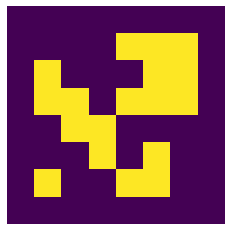

In [ ]:
aruco_dict = aruco.Dictionary_get(aruco.DICT_6X6_1000)
marker_length = 3.7
marker_separation = 1.1
arucoParams = aruco.DetectorParameters_create()
board = aruco.GridBoard_create(1,1,marker_length,marker_separation,aruco_dict)
imboard = board.draw((2000,2000))
cv2.imwrite("chessboard.png",imboard)
fig = plt.figure()
ax = fig.add_subplot(1,1,1)
plt.imshow(imboard,interpolation='nearest')
ax.axis("off")
plt.show()

In [ ]:
counter, corners_list, id_list = [], [], []
first = 0
folder = '/content/task3'
for filename in os.listdir(folder):
    img = cv2.imread(os.path.join(folder,filename))
    if img is not None:
        img_gray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)
        corners, ids, rejected = aruco.detectMarkers(
            img_gray,
            aruco_dict,
            parameters=arucoParams
        )
    if first == 0:
        corners_list = corners
        id_list = ids
    else:
        corners_list = np.vstack((corners_list, corners))
        id_list = np.vstack((id_list,ids))
    first = first + 1
    counter.append(len(ids))


In [ ]:
counter = np.array(counter)
ret,mtx,dist,rvecs,tvecs = aruco.calibrateCameraAruco(
    corners_list,
    id_list,
    counter,
    board,
    img_gray.shape,
    None,
    None
)

In [ ]:
mtx

array([[9.32343219e+03, 0.00000000e+00, 1.72872338e+03],
       [0.00000000e+00, 6.32954367e+03, 2.20515981e+03],
       [0.00000000e+00, 0.00000000e+00, 1.00000000e+00]])

In [ ]:
tvecs

(array([[ -0.7831856 ],
        [-26.99048614],
        [118.35612591]]),)

Task4

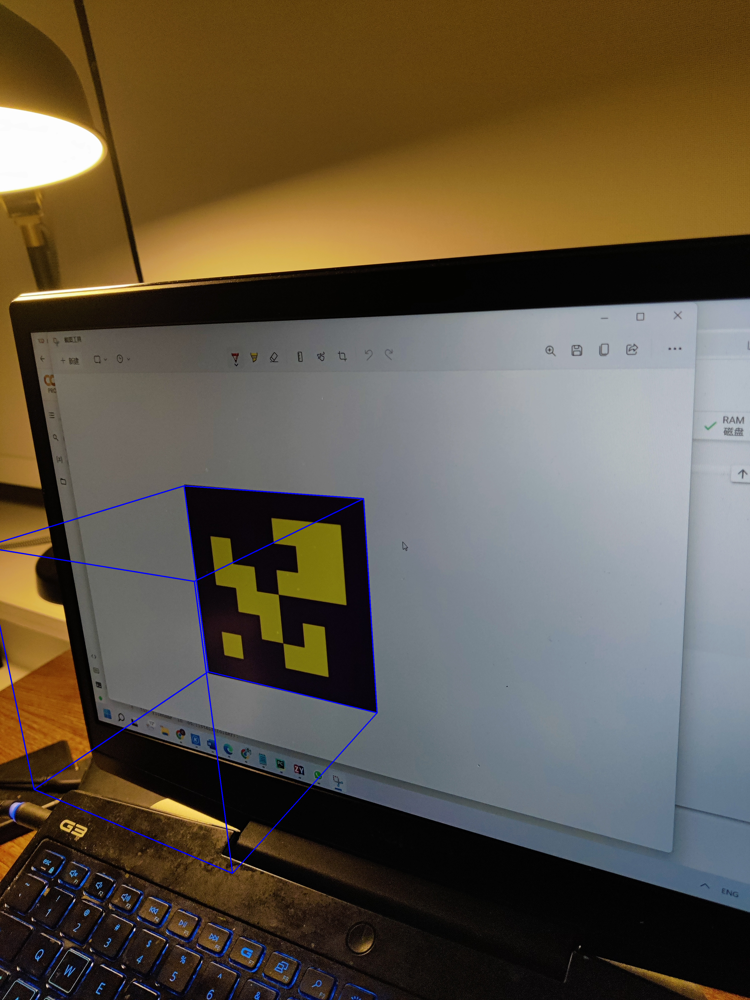

In [ ]:
import cv2
import cv2.aruco as aruco
import numpy as np
from google.colab.patches import cv2_imshow


cube = np.float32([[0.025,-0.025,0], [-0.025,0.025,0], [0.025,0.025,0], [-0.025,-0.025,0],
                    [0.025,-0.025,0.05], [-0.025,0.025,0.05], [0.025,0.025,0.05], [-0.025,-0.025,0.05]
                    ])

img = cv2.imread("/content/task4_1.jpg")

scale_percent = 50 # percent of original size
width = int(img.shape[1] * scale_percent / 100)
height = int(img.shape[0] * scale_percent / 100)
dim = (width, height)

aruco_dict = aruco.getPredefinedDictionary(aruco.DICT_6X6_1000)
parameters = aruco.DetectorParameters_create()
corners, ids, _ = aruco.detectMarkers(img, aruco_dict, parameters=parameters)
center = (width, height)
focal_length = center[0] / np.tan(60/2 * np.pi / 180)
camera_matrix = np.array(
            [[focal_length, 0, center[0]],
            [0, focal_length, center[1]],
            [0, 0, 1]], dtype = "double"
        )
dist_coeffs = np.zeros((4,1)) 
if len(corners) > 0:
    for i, corner in enumerate(corners):
        rvecs, tvecs, _objPoints = aruco.estimatePoseSingleMarkers(corner, 0.05, camera_matrix, dist_coeffs)
        tvec = np.squeeze(tvecs)
        rvec = np.squeeze(rvecs)
        rvec_matrix = cv2.Rodrigues(rvec) 
        rvec_matrix = rvec_matrix[0]      

       
        imgpts, jac = cv2.projectPoints(cube, rvecs, tvecs, camera_matrix, dist_coeffs)
        outpts = []
        for lp in imgpts:
            lp_int = lp.astype(np.int64)
            outpts.append( tuple(lp_int.ravel()) )

        
        cv2.line(img,outpts[0],outpts[2],(255,0,0),4)
        cv2.line(img,outpts[1],outpts[2],(255,0,0),4)
        cv2.line(img,outpts[1],outpts[3],(255,0,0),4)
        cv2.line(img,outpts[3],outpts[0],(255,0,0),4)

        
        cv2.line(img,outpts[4],outpts[6],(255,0,0),4)
        cv2.line(img,outpts[5],outpts[6],(255,0,0),4)
        cv2.line(img,outpts[5],outpts[7],(255,0,0),4)
        cv2.line(img,outpts[7],outpts[4],(255,0,0),4)

        
        cv2.line(img,outpts[0],outpts[4],(255,0,0),4)
        cv2.line(img,outpts[1],outpts[5],(255,0,0),4)
        cv2.line(img,outpts[2],outpts[6],(255,0,0),4)
        cv2.line(img,outpts[3],outpts[7],(255,0,0),4)

        

cv2_imshow(img)


In [ ]:
cv2.imwrite("task4_1_processed.jpg", img)

True